el eda vamos a hacerlo sobre el data original, antes de aplicar standarizacion, one hot ni nada

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
data = pd.read_csv('./data/customer_segmentation.csv')
scaled_data = pd.read_csv('./data/df_scaled_data.csv') # el data ya escalado y limpio de antes

In [5]:
# recuerdo de la limpieza que habia una columna con nulos, asi que esa vamos a arreglarla

# la columna Dt_Customer tambien la modifique de fechas a int y prefiero hacer el eda asi, de modo que recupero esa columna

data[['Income', 'Dt_Customer']] = scaled_data[['Income', 'Dt_Customer_hours']]

In [6]:
data.head() # he reemplazado los valores de las columnas en cuestion con los valores de estas mismas columnas que obtuve en la limpieza, estos valores ya estan escalados pero no creo que afecte al eda

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,0.235327,0,0,-1.531185,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,-0.235826,1,1,1.190545,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,0.773633,0,0,0.205773,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,-1.022732,1,0,1.061881,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,0.241519,1,0,0.953012,94,173,...,5,0,0,0,0,0,0,3,11,0


In [7]:
# la columna del año de nacimiento me da problemas luego para las representaciones, es horrible, la voy a cambiar por una de edad

data['Age'] = 2024 - data['Year_Birth']

In [8]:
data.drop(['Age'], axis= 1, inplace= True)

In [9]:
data.info() # all good in the hood

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2240 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   float64
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [10]:
numericas = list(data.select_dtypes(include= np.number).columns)
categoricas = list(data.select_dtypes(include= object).columns)

# he encontrado esta forma superpractica de comprobar y seleccionar categoricas o numericas, 5 meses y lo encuentro ahora...

In [11]:
print(numericas, '\n', categoricas) # parece que funciona como un tiro

['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'] 
 ['Education', 'Marital_Status']


outliers

In [12]:
# voy a crear un generador para hacer subplots

def gen_sub():

    for i in range(5):
        for j in range(6):
            yield i, j

generator = gen_sub()

'\nnos encontramos outliers en muchas features,\n\n.- year_birth, estos outliers posiblemente me los quite de enmedio, son pocos y las fechas de estos outliers son muy antiguas, igual es un error\n.- income tiene outliers, pero solo uno me parece extraño, el mas extremo, es interesante saber los habitos de consumo de clientes con una renta superior a lo habitual\n.- las features de gastos en diferentes tipos de productos contienen muchos outliers\n.- la cantidad de compras en ofertas, por web, catalogo o en store tambien contiene outliers pero muchos menos\n.- visitas a la web contiene pocos outliers\n.- la aceptacion de las distintas campañas contiene outliers, pero estas son features binarias, los outliers son predecibles, la opcion menos repetida sera el outlier de la feature\n\nDBScan maneja bien los outliers, es capaz de reconocerlos y tratarlos para no inferir en la definicion delos clusteres. No eiminare outliers entonces para no eliminar informacion\n'

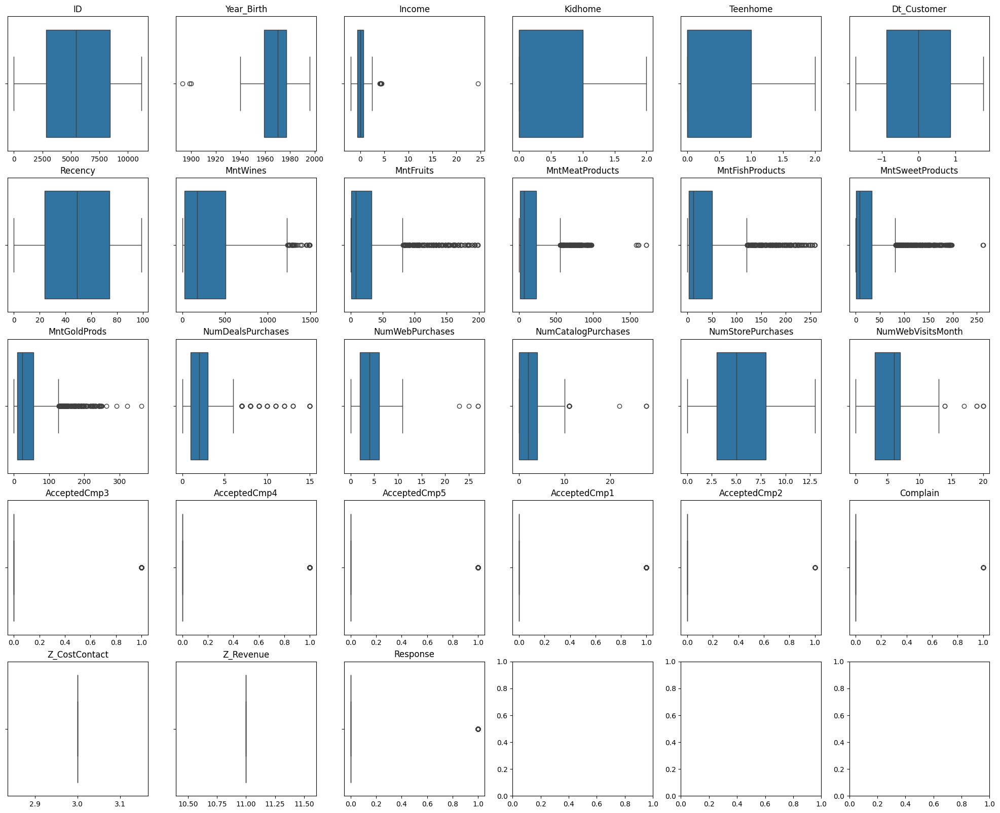

In [13]:
fig, axs = plt.subplots(5, 6, figsize= (25, 20))

for col in numericas:
    spot = next(generator)
    sns.boxplot(x= data[col], ax= axs[spot])
    axs[spot].set_title(col)
    axs[spot].set_xlabel('')
    

'''
nos encontramos outliers en muchas features,

.- year_birth, estos outliers posiblemente me los quite de enmedio, son pocos y las fechas de estos outliers son muy antiguas, igual es un error
.- income tiene outliers, pero solo uno me parece extraño, el mas extremo, es interesante saber los habitos de consumo de clientes con una renta superior a lo habitual
.- las features de gastos en diferentes tipos de productos contienen muchos outliers
.- la cantidad de compras en ofertas, por web, catalogo o en store tambien contiene outliers pero muchos menos
.- visitas a la web contiene pocos outliers
.- la aceptacion de las distintas campañas contiene outliers, pero estas son features binarias, los outliers son predecibles, la opcion menos repetida sera el outlier de la feature

DBScan maneja bien los outliers, es capaz de reconocerlos y tratarlos para no inferir en la definicion delos clusteres. No eiminare outliers entonces para no eliminar informacion
'''
    

vamos a empezar con una visualizacion grafica de correlaciones  

(reconozco que aqui estoy un pelin perdido, no tengo target para comparar la features, aunque tengo algunas relaciones que me parecen interesantes y estudiaremos a continuacion)

In [14]:
# tenemos una serie de features que indican la cntaidad gastada en diferentes productos
# tenemos otras features que indican el modo de compra, fisica, online, etc
# columna de edad, etc

# creo que puede ser interesante estudiar las correlaciones entre todo esto

shopping_article = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
shopping_method = ['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumDealsPurchases']

In [15]:
# quiero dos nuevas columnas con el total de gasto de cada instancia y el total de compras por cada modo de compra

data['Total_spending'] = data[shopping_article].sum(axis= 1)
data['Total_purchases'] = data[shopping_method].sum(axis= 1)

<Axes: xlabel='Year_Birth', ylabel='Total_spending'>

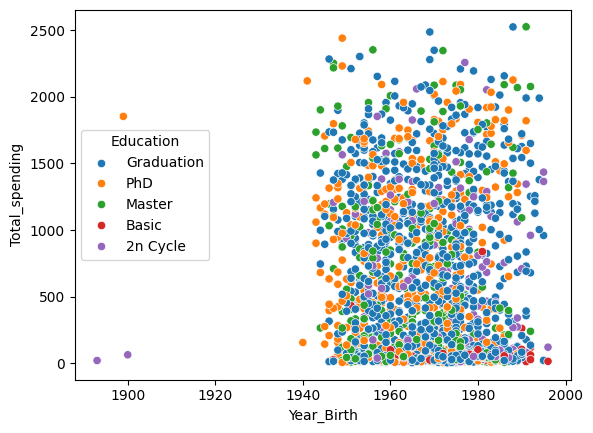

In [16]:
# ahora quiero estudiar graficamente la relacion entre el total de compras y de gasto con las edades, educacion e income especificado por la tipologia de turno

sns.scatterplot(data, y= 'Total_spending', x= 'Year_Birth', hue= 'Education')

# no aprecio correlaciones especialmente significativas entre el gasto en funcion de la edad (año de nacimiento). En ninguno de los distintos tipos de educacion

<Axes: xlabel='Income', ylabel='Total_spending'>

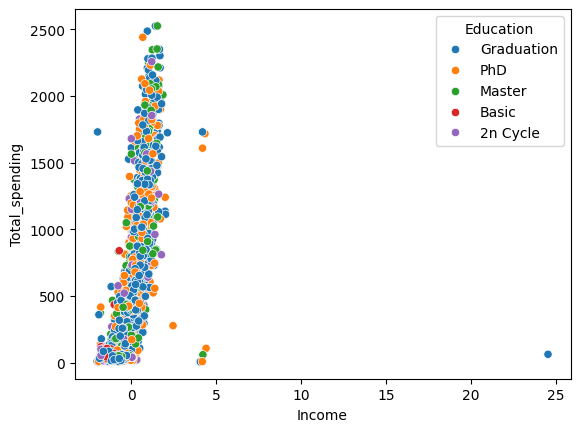

In [17]:
# a ver el gasto en funcion de la renta
sns.scatterplot(data, y= 'Total_spending', x= 'Income', hue= 'Education')

# aqui si hay una correlacion mas interesante, mientras mas ganas mas gastas, obvio
# me molesta el outlier de la renta, dificulta la vision de la grafica, voy a graficar sin eso

<Axes: xlabel='Income', ylabel='Total_spending'>

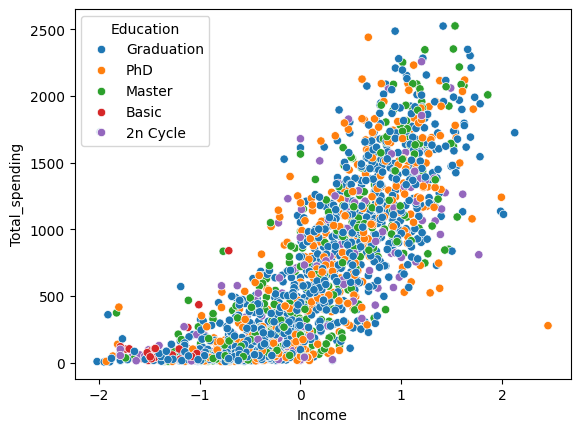

In [18]:
sns.scatterplot(data[data['Income'] < 3], y= 'Total_spending', x= 'Income', hue= 'Education')

# aqui se ve un poco mejor

# es curioso, los puntos naranja (doctorado) no siguen una recta tan clara como las otras categorias educativas 
# la educacion basica se mantiene en unos niveles de renta muy bajos

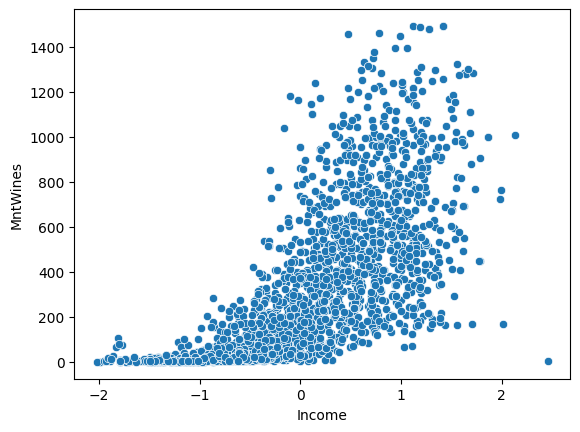

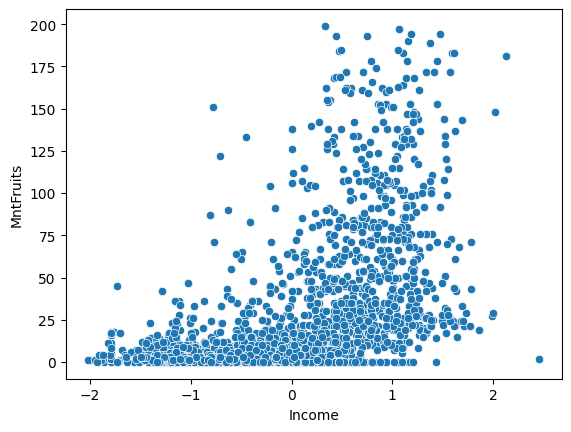

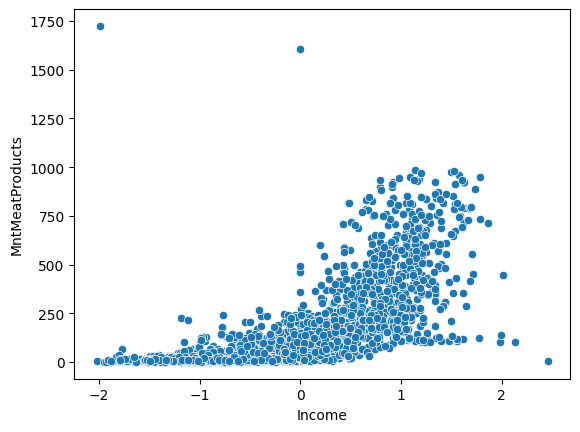

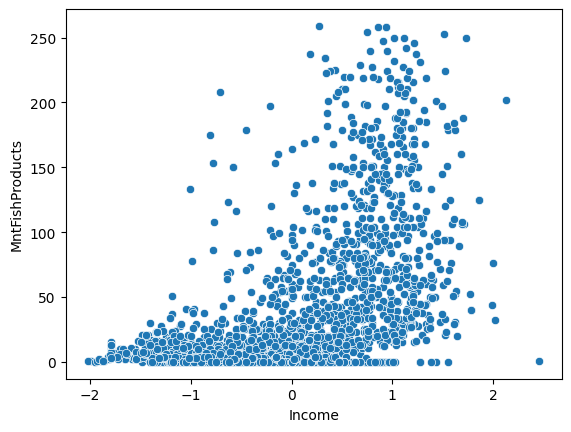

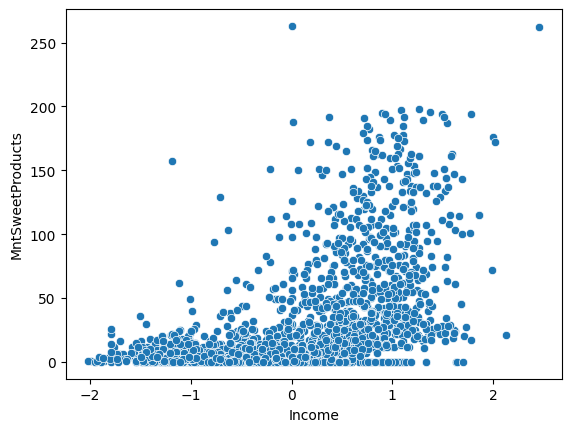

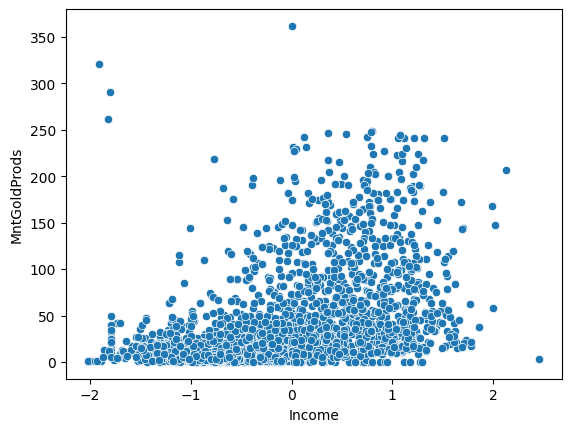

In [19]:
# tengo curiosidad de ver la correlacion del tipo de consumo en funcion de la renta

for product in shopping_article:
    sns.scatterplot(data[data['Income'] < 3], y= product, x= 'Income')
    plt.show()

# pescado, frutas y vinos parecen tener una relacion mas elastica, a poco que aumentamos la renta aumenta notoriamente el consumo de estos productos

# la carne parece mas inelastica, los consumidores mantienen un consumo de carne mas estable, obviamente al aumentar la renta aumenta el consumo, pero mas paulatinamente

# los productos gold mantienen una correlacion ciertamente, pero mas dispersa que las otras categorias, podemos observar puntos donde la renta es muy baja y encontramos un consumo de productos gold
# muy fuerte, de los mas elevados en la grafica incluso. ¿denota esto que quien menos gana mas gasta en lujo? supongo que esto demuestra que financieramente hablando somos idiotas

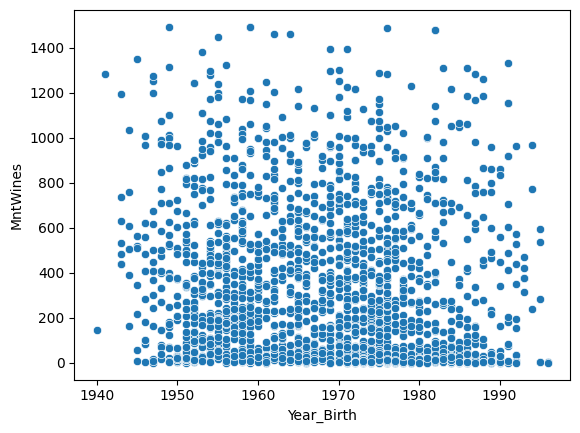

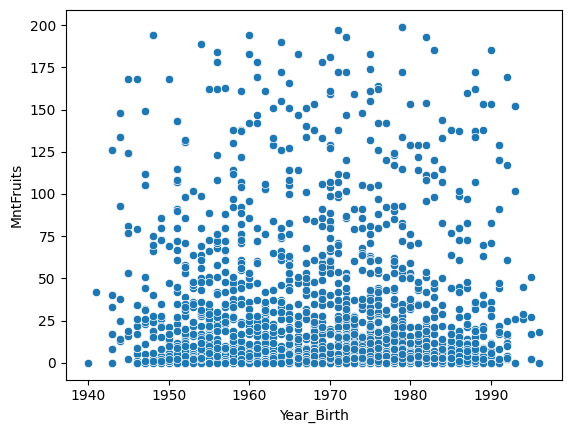

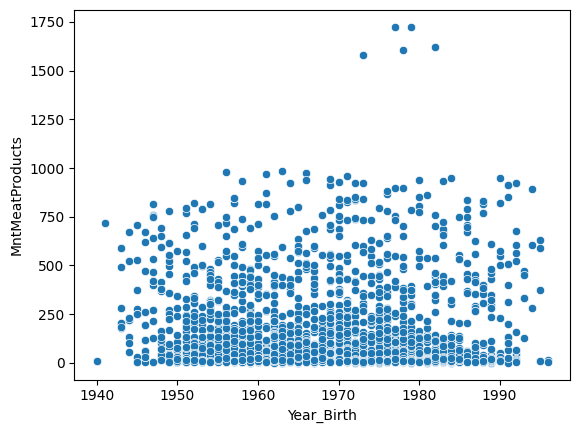

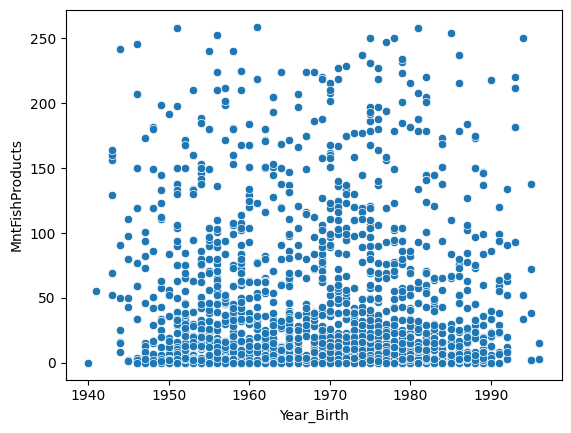

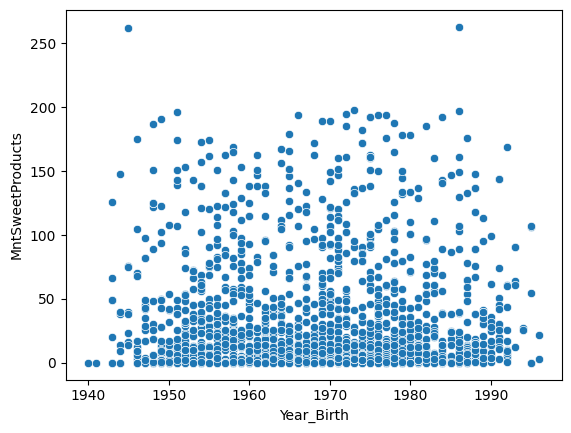

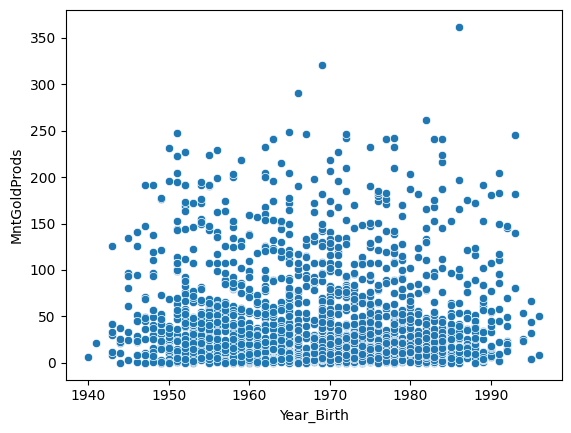

In [20]:
# quiero ver el tipo de producto por la edad

# voy a quitar el par de outliers del año de nacimiento que estorban mucho para visualizar

for fea in shopping_article:
    sns.scatterplot(data[data['Year_Birth'] > 1920], y= fea, x= 'Year_Birth')
    plt.show()

# no aprecio correlaciones exageradas en el año de nacimiento y el gasto en determinados tipos de producto

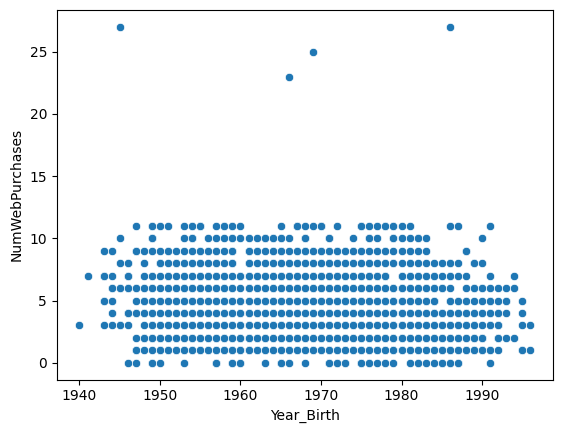

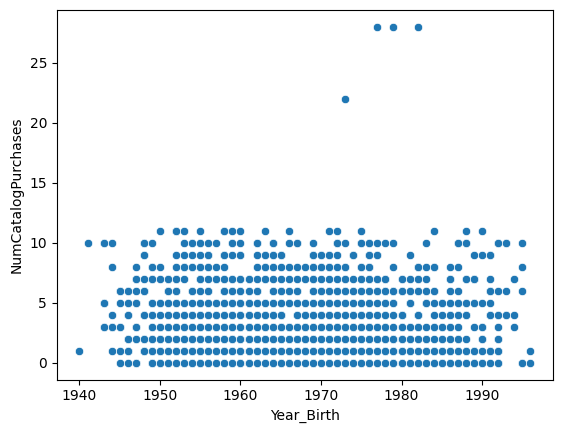

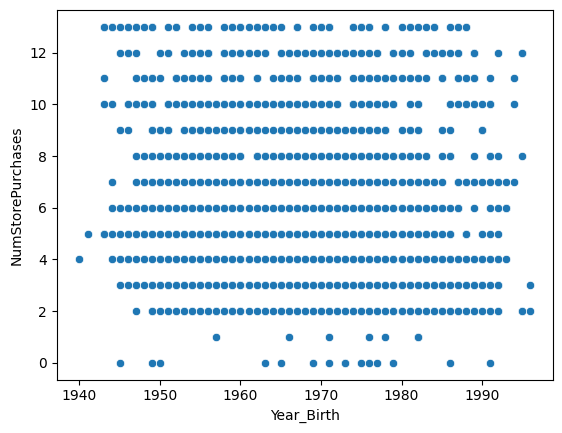

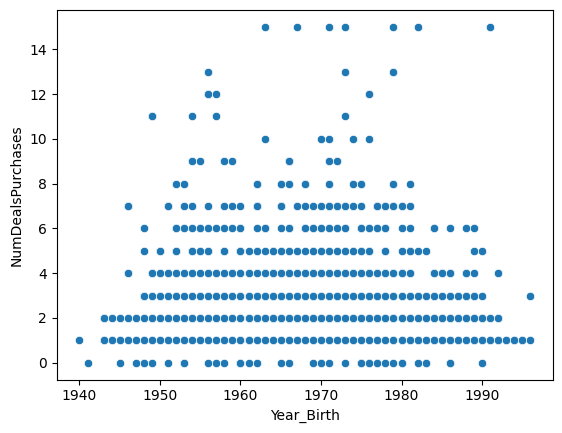

In [21]:
# y relacion entre el año de nacimiento y la modalidad de compra?

for fea in shopping_method:
    sns.scatterplot(data[data['Year_Birth'] > 1920], y= fea, x= 'Year_Birth')
    plt.show()

# tampoco veo una relacion especialmente clara entre la edad y el metodo de compra, lo unico que me llama un pelin la atencion es que las compras por catalogo o por web tienen cantidades mas altas que en tienda
# debido a esos puntos extraños, despues se mantienen parejos

In [22]:
for fea in shopping_method:
    print(f'compras en {fea} -> {data[fea].sum()}')

# se compra mas en store que en las otras modalidades, pero via web lo sigue de cerca

compras en NumWebPurchases -> 9150
compras en NumCatalogPurchases -> 5963
compras en NumStorePurchases -> 12970
compras en NumDealsPurchases -> 5208


In [23]:
# vamos a hacer un pairplot de todas las numericas

sns.pairplot(data)
plt.savefig('pairplot_todo.png')
plt.show()

In [24]:
# ufffffffff esto es dificil de ver, vamos a mirar mas de cerca aquellas relaciones que parezcan mas interesantes desde esta primera perspectiva
# he guardado el pairplot en una imagen para poder hacer zoom y sacar las features que veo correlaciones interesantes y sacarlas mas detalladas a continuacion

int_corr = [
    ['Total_spending', 'MntWines'],
    ['Total_spending', 'MntFruits'], 
    ['Total_spending', 'MntMeatProducts'],
    ['Total_spending', 'MntFishProducts'],
    ['Total_spending', 'MntSweetProducts'],
    ['Total_spending', 'MntGoldProds'],
    ['Total_spending', 'NumWebPurchases'],
    ['Total_spending', 'NumCatalogPurchases'],
    ['Total_spending', 'NumStorePurchases'],
    ['Total_spending', 'NumDealsPurchases'],
    ['Total_purchases', 'MntWines'],
    ['Total_purchases', 'MntFruits'], 
    ['Total_purchases', 'MntMeatProducts'],
    ['Total_purchases', 'MntFishProducts'],
    ['Total_purchases', 'MntSweetProducts'],
    ['Total_purchases', 'MntGoldProds'],
    ['Total_purchases', 'NumWebPurchases'],
    ['Total_purchases', 'NumCatalogPurchases'],
    ['Total_purchases', 'NumStorePurchases'],
    ['Total_purchases', 'NumDealsPurchases']
]

# las correlaciones de income tambien son curiosas pero ya las vimos antes

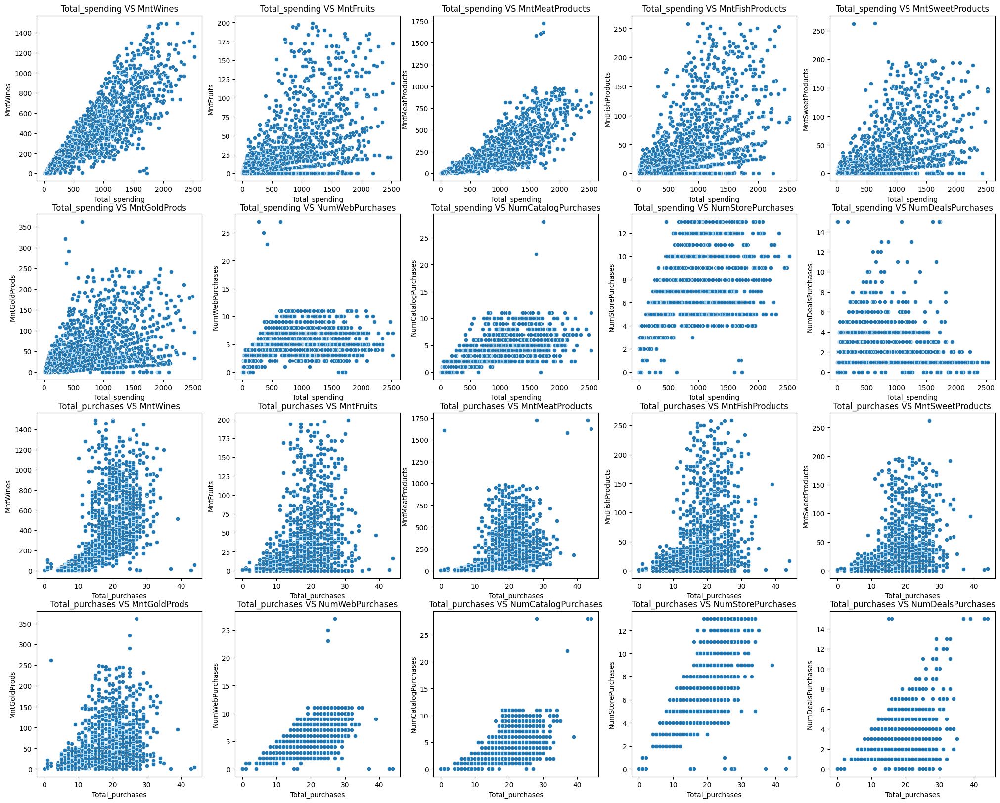

In [25]:
def gen_sub():

    for i in range(4):
        for j in range(5):
            yield i, j

generator = gen_sub()

fig, axs = plt.subplots(4, 5, figsize= (25, 20))

for pair in int_corr:
    spot = next(generator)
    sns.scatterplot(data, x= pair[0], y= pair[1], ax= axs[spot])
    axs[spot].set_title(f'{pair[0]} VS {pair[1]}')
    #axs[spot].set_xlabel('')

In [26]:
# tengo curiosidad de en funcion de la renta que se gana, en que productos se gasta mas y menos

# para ello primero voy a acategorizar el income en low, medium y high y buscar esta distribucion de gasto en un barplot

data['Income'].describe() # quiero ver los maximos, los misnimos y la mediana (la media no es representativa en este caso) para categorizar 

#ojo! las cifras estan standarizadas de la limpieza, sin embargo son validas, mantienen la relacion


count    2.240000e+03
mean     4.837400e-17
std      1.000223e+00
min     -2.018090e+00
25%     -6.674801e-01
50%     -2.020403e-02
75%      6.408743e-01
max      2.454513e+01
Name: Income, dtype: float64

<Axes: xlabel='Income', ylabel='Count'>

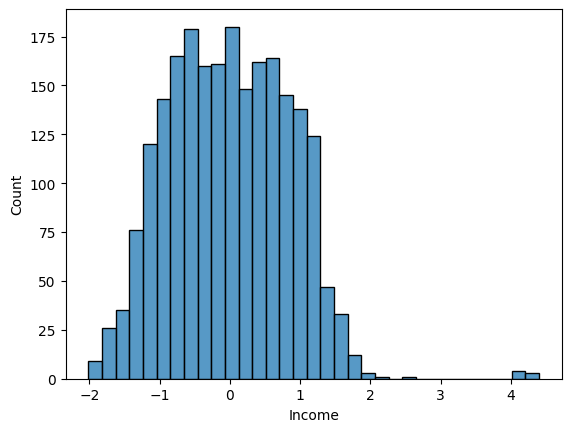

In [27]:
sns.histplot(data[data['Income'] < 10]['Income']) # el outlier ese de 25 en income es muy molesto para graficar asi que lo quito

In [29]:
def categorizar_income(x):

    if x < -1:
        return 'low'
    elif x < 1:
        return 'medium'
    else:
        return 'high'

In [31]:
data['cat_income'] = data['Income'].apply(categorizar_income) # ya tengo aqui la columna categorica

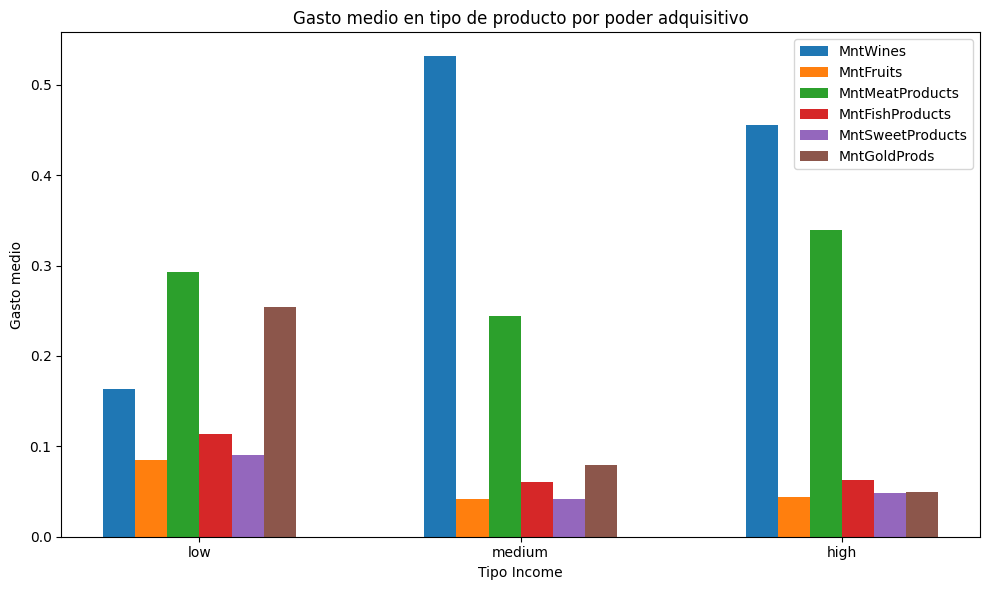

In [68]:
categorias = ['low', 'medium', 'high']
variables_numericas = {
    'MntWines': [data[data['cat_income'] == renta]['MntWines'].sum()/data[data['cat_income'] == renta]['Total_spending'].sum() for renta in categorias],
    'MntFruits': [data[data['cat_income'] == renta]['MntFruits'].sum()/data[data['cat_income'] == renta]['Total_spending'].sum() for renta in categorias],
    'MntMeatProducts': [data[data['cat_income'] == renta]['MntMeatProducts'].sum()/data[data['cat_income'] == renta]['Total_spending'].sum() for renta in categorias],
    'MntFishProducts': [data[data['cat_income'] == renta]['MntFishProducts'].sum()/data[data['cat_income'] == renta]['Total_spending'].sum() for renta in categorias],
    'MntSweetProducts': [data[data['cat_income'] == renta]['MntSweetProducts'].sum()/data[data['cat_income'] == renta]['Total_spending'].sum() for renta in categorias],
    'MntGoldProds': [data[data['cat_income'] == renta]['MntGoldProds'].sum()/data[data['cat_income'] == renta]['Total_spending'].sum() for renta in categorias]
}

# Configuración de la figura y los ejes
fig, ax = plt.subplots(figsize=(10, 6))

# Ancho de las barras
bar_width = 0.1

# Índices para las posiciones de las barras
indice = np.arange(len(categorias))

# Gráfico de barras para cada variable numérica
for i, (variable, valores) in enumerate(variables_numericas.items()):
    
    ax.bar(indice + i * bar_width, valores, bar_width, label=variable)

# Configuración de ejes y etiquetas
ax.set_xlabel('Tipo Income')
ax.set_ylabel('Gasto medio')
ax.set_title('Gasto medio en tipo de producto por poder adquisitivo')
ax.set_xticks(indice + bar_width*2.5)
ax.set_xticklabels(categorias)
ax.legend()

# Mostrar la gráfica
plt.tight_layout()
#plt.savefig('elo_tipos_por_paises.png')
plt.show()

In [73]:
import pprint
pprint.pprint(variables_numericas) 
# como la funcion es relativamente compleja quiero comprobar que esta bien hecha, la suma de los diferentes gastos en cada producto por cada tipo de income deberia ser 1 (hablamos en porcentajes de gasto)

total_low = 0
total_medium = 0
total_high = 0

for i in variables_numericas.values():
    total_low += i[0]
    total_medium += i[1]
    total_high += i[2]

print()
print('totales -> ', total_low, total_medium, total_high)

# esta correcto

{'MntFishProducts': [0.11416016081529615,
                     0.06023100851921241,
                     0.06295123260423517],
 'MntFruits': [0.0852227572343509, 0.04208460002120966, 0.04414324188042728],
 'MntGoldProds': [0.25440605862278526,
                  0.07960249566969493,
                  0.04904623921514863],
 'MntMeatProducts': [0.2931606750502548, 0.244625782106119, 0.3398404550725109],
 'MntSweetProducts': [0.09013136365761301,
                      0.041902329527378136,
                      0.0482422406000711],
 'MntWines': [0.16291898461969986, 0.5315537841563859, 0.4557765906276069]}

totales ->  0.9999999999999998 0.9999999999999999 1.0
